In [1]:
import sys
import stlearn as st
st.settings.set_figure_params(dpi=300)
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import sys
file = Path("../stimage").resolve()
parent= file.parent
sys.path.append(str(parent))
from PIL import Image
from stimage.utils import gene_plot, Read10X, ReadOldST
from stimage.model import CNN_NB_trainable
from stimage.data_generator import DataGenerator
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

In [2]:
from typing import Optional, Union
from anndata import AnnData
from pathlib import Path

# Test progress bar
from tqdm import tqdm
import numpy as np
import os


def tiling(
        adata: AnnData,
        out_path: Union[Path, str] = "./tiling",
        library_id: str = None,
        crop_size: int = 40,
        target_size: int = 299,
        verbose: bool = False,
        copy: bool = False,
) -> Optional[AnnData]:
    """\
    Tiling H&E images to small tiles based on spot spatial location

    Parameters
    ----------
    adata
        Annotated data matrix.
    out_path
        Path to save spot image tiles
    library_id
        Library id stored in AnnData.
    crop_size
        Size of tiles
    verbose
        Verbose output
    copy
        Return a copy instead of writing to adata.
    target_size
        Input size for convolutional neuron network
    Returns
    -------
    Depending on `copy`, returns or updates `adata` with the following fields.
    **tile_path** : `adata.obs` field
        Saved path for each spot image tiles
    """

    if library_id is None:
        library_id = list(adata.uns["spatial"].keys())[0]

    # Check the exist of out_path
    if not os.path.isdir(out_path):
        os.mkdir(out_path)

    image = adata.uns["spatial"][library_id]["images"][adata.uns["spatial"]["use_quality"]]
    if image.dtype == np.float32 or image.dtype == np.float64:
        image = (image * 255).astype(np.uint8)
    img_pillow = Image.fromarray(image)
    tile_names = []

    with tqdm(
            total=len(adata),
            desc="Tiling image",
            bar_format="{l_bar}{bar} [ time left: {remaining} ]",
    ) as pbar:
        for imagerow, imagecol in zip(adata.obs["imagerow"], adata.obs["imagecol"]):
            imagerow_down = imagerow - crop_size / 2
            imagerow_up = imagerow + crop_size / 2
            imagecol_left = imagecol - crop_size / 2
            imagecol_right = imagecol + crop_size / 2
            tile = img_pillow.crop(
                (imagecol_left, imagerow_down, imagecol_right, imagerow_up)
            )
            # tile.thumbnail((target_size, target_size), Image.ANTIALIAS)
            tile = tile.resize((target_size, target_size))
            tile_name = library_id + "-" + str(imagecol) + "-" + str(imagerow) + "-" + str(crop_size)
            out_tile = Path(out_path) / (tile_name + ".jpeg")
            tile_names.append(str(out_tile))
            if verbose:
                print(
                    "generate tile at location ({}, {})".format(
                        str(imagecol), str(imagerow)
                    )
                )
            tile.save(out_tile, "JPEG")

            pbar.update(1)

    adata.obs["tile_path"] = tile_names
    return adata if copy else None

In [3]:
BASE_PATH = Path("/clusterdata/uqxtan9/Xiao/STimage/dataset/breast_cancer_10x_visium")
TILE_PATH = Path("/tmp") / "tiles"
TILE_PATH.mkdir(parents=True, exist_ok=True)

SAMPLE = "block1"
Sample1 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif", 0)
Sample1.uns["spatial"][SAMPLE]['images']["fulres"] = img

SAMPLE = "block2"
Sample2 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_2_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_2_image.tif", 0)
Sample2.uns["spatial"][SAMPLE]['images']["fulres"] = img

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [93]:
Sample1.obsm['cm'] = Sample1.to_df()

In [94]:
Sample1.obsm['cm']

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL732372.1,...,AC133551.1,AC136612.1,AC136616.1,AC136616.3,AC136616.2,AC141272.1,AC023491.2,AC007325.1,AC007325.4,AC007325.2
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACAGAGCGACTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACAGGGTCTATATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACAGTGTTCCTGGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTGTTTCATTAGTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTGTTTCCATACAACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
gene_list=["SLITRK6", "PGM5", "LINC00645", 
           "TTLL12", "COX6C", "CPB1",
           "KRT5", "MALAT1"]
gene = [gene_list[4]]
print(gene)

['COX6C']


In [5]:
for adata in [
    Sample1,
    Sample2,
]:
#     count_df = adata.to_df()
#     count_df[count_df <=1] = 0
#     count_df[count_df >1] = 1
#     adata.X = count_df
#     adata[:,gene_list]
    st.pp.filter_genes(adata,min_cells=3)
#     st.pp.normalize_total(adata)
    st.pp.log1p(adata)
#     st.pp.scale(adata)

    # pre-processing for spot image
    TILE_PATH_ = TILE_PATH / list(adata.uns["spatial"].keys())[0]
    TILE_PATH_.mkdir(parents=True, exist_ok=True)
    tiling(adata, TILE_PATH_, crop_size=299)

Log transformation step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]


Log transformation step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]


In [6]:
n_genes = len(gene)

In [7]:
tuple([1]*n_genes)

(1,)

In [8]:
training_index = Sample1.obs.sample(frac=0.7, random_state=1).index
training_dataset = Sample1[training_index,].copy()

valid_index = Sample1.obs.index.isin(training_index)
valid_dataset = Sample1[~valid_index,].copy()

test_dataset = Sample2.copy()

train_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=training_dataset, 
                          genes=gene, aug=False),
            output_types=(tf.float32, tuple([tf.float32]*n_genes)), 
            output_shapes=([299,299,3], tuple([1]*n_genes))
)
train_gen_ = train_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
valid_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=valid_dataset, 
                          genes=gene), 
            output_types=(tf.float32, tuple([tf.float32]*n_genes)), 
            output_shapes=([299,299,3], tuple([1]*n_genes))
)
valid_gen_ = valid_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
test_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=test_dataset, 
                          genes=gene), 
            output_types=(tf.float32, tuple([tf.float32]*n_genes)), 
            output_shapes=([299,299,3], tuple([1]*n_genes))
)
test_gen_ = test_gen.batch(1)

In [9]:
test_dataset

AnnData object with n_obs × n_vars = 3987 × 22345
    obs: 'in_tissue', 'array_row', 'array_col', 'sum_counts', 'imagecol', 'imagerow', 'tile_path'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial', 'log1p'
    obsm: 'spatial', 'filtered_counts'

In [38]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input as preprocess_vgg16
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input as preprocess_resnet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input, concatenate, Dropout, Lambda
from tensorflow.keras.models import Model
import tensorflow_probability as tfp
tf.compat.v1.enable_eager_execution()
tfd = tfp.distributions
tfb = tfp.bijectors
import six
from tensorflow.python.keras import backend as K
from tensorflow.python.keras.utils.tf_utils import is_tensor_or_variable

def ZINB_layer(out): 
    n = tf.squeeze(tf.math.softplus(out[:,0:1]))

    p = tf.squeeze(tf.math.sigmoid(out[:,1:2]))

    s = tf.math.sigmoid(out[:,2:3])

    probs = tf.concat([1-s, s], axis=1)
    
    mix = tfd.Mixture(
          cat=tfd.Categorical(probs=probs),
          components=[
          tfd.Deterministic(loc=tf.zeros_like(n)),
          tfd.NegativeBinomial(total_count=n, probs=p),
        ])
    return mix


def NB_layer(out): 
    n = tf.squeeze(tf.math.softplus(out[:,0:1]))

    p = tf.squeeze(tf.math.sigmoid(out[:,1:2]))

#     s = tf.math.sigmoid(out[:,2:3])

#     probs = tf.concat([1-s, s], axis=1)
    
    NB = tfd.NegativeBinomial(total_count=n, probs=p)
    
    return NB


def NLL(y_true, y_hat):
    return -y_hat.log_prob(tf.reshape(y_true,(-1,)))


class MeanMetricWrapper(tf.keras.metrics.Mean):
    def __init__(self, fn, name=None, dtype=None, **kwargs):
        super(MeanMetricWrapper, self).__init__(name=name, dtype=dtype)
        self._fn = fn
        self._fn_kwargs = kwargs
    def update_state(self, y_true, y_pred, sample_weight=None):
        matches = self._fn(y_true, y_pred, **self._fn_kwargs)
        return super(MeanMetricWrapper, self).update_state(
                     matches, sample_weight=sample_weight)
    def get_config(self):
        config = {}
        for k, v in six.iteritems(self._fn_kwargs):
            config[k] = K.eval(v) if is_tensor_or_variable(v) else v
        base_config = super(MeanMetricWrapper, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))


def vgg16_ZINB(tile_shape):
    tile_input = Input(shape=tile_shape, name = "tile_input")
    VGG16_base = VGG16(input_tensor=tile_input, weights='imagenet', include_top=False)
    for layer in VGG16_base.layers:
        layer.trainable = False
    
    cnn = VGG16_base.output
    cnn = GlobalAveragePooling2D()(cnn)
    cnn = Dropout(0.5)(cnn)
    cnn = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l1(0.01),
                activity_regularizer=tf.keras.regularizers.l2(0.01))(cnn)
    # cnn = Dense(256, activation='relu')(cnn)
    
    outputs = Dense(3)(cnn)

#     p_y_zinb = tfp.layers.DistributionLambda(zero_inf)(outputs)
    p_y_zinb = tfp.layers.DistributionLambda(ZINB_layer)(outputs)

    model = Model(inputs=tile_input, outputs=[p_y_zinb])

#     optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(0.001)

    model.compile(loss=NLL,
                  optimizer=optimizer,
                  metrics=[MeanMetricWrapper(NLL, name="nll")])    
    return model


def vgg16_NB(tile_shape):
    tile_input = Input(shape=tile_shape, name = "tile_input")
    VGG16_base = VGG16(input_tensor=tile_input, weights='imagenet', include_top=False)
    for layer in VGG16_base.layers:
        layer.trainable = False
    
    cnn = VGG16_base.output
    cnn = GlobalAveragePooling2D()(cnn)
    cnn = Dropout(0.5)(cnn)
    cnn = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l1(0.01),
                activity_regularizer=tf.keras.regularizers.l2(0.1))(cnn)
    # cnn = Dense(256, activation='relu')(cnn)
    
    outputs = Dense(2)(cnn)

#     p_y_zinb = tfp.layers.DistributionLambda(zero_inf)(outputs)
    p_y_nb = tfp.layers.DistributionLambda(NB_layer)(outputs)

    model = Model(inputs=tile_input, outputs=[p_y_nb])

#     optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(0.0001)

    model.compile(loss=NLL,
                  optimizer=optimizer,
                  metrics=[MeanMetricWrapper(NLL, name="nll")])    
    return model

In [7]:
def resnet_ZINB(tile_shape):
    tile_input = Input(shape=tile_shape, name = "tile_input")
    resnet_base = ResNet50(input_tensor=tile_input, weights='imagenet', include_top=False)
    stage_5_start = resnet_base.get_layer("conv5_block1_1_conv")
    for i in range(resnet_base.layers.index(stage_5_start)):
        resnet_base.layers[i].trainable = False
    
    cnn = resnet_base.output
    cnn = GlobalAveragePooling2D()(cnn)
    cnn = Dropout(0.5)(cnn)
    cnn = Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l1(0.01),
                activity_regularizer=tf.keras.regularizers.l2(0.01))(cnn)
    # cnn = Dense(256, activation='relu')(cnn)
    
    outputs = Dense(3)(cnn)

#     p_y_zinb = tfp.layers.DistributionLambda(zero_inf)(outputs)
    p_y_zinb = tfp.layers.DistributionLambda(ZINB_layer)(outputs)

    model = Model(inputs=tile_input, outputs=p_y_zinb)

#     optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(0.001)

    model.compile(loss=NLL,
                  optimizer=optimizer,
                  metrics=[MeanMetricWrapper(NLL, name="nll")])    
    return model

In [39]:
# model = vgg16_ZINB((299, 299, 3))
# model = resnet_ZINB((299, 299, 3))
model = vgg16_NB((299, 299, 3))
callback = tf.keras.callbacks.EarlyStopping(monitor='val_nll', patience=20,
                                            restore_best_weights=False)

In [107]:
print(model.summary())

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
tile_input (InputLayer)      [(None, 299, 299, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 299, 299, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 299, 299, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 149, 149, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 149, 149, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 149, 149, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 74, 74, 128)       0   

In [40]:
train_history = model.fit(train_gen_,
                          epochs=10,
                          validation_data=valid_gen_,
                          callbacks=[callback]
                          )

Epoch 1/10
63/63 [==============================] - 31s 480ms/step - loss: 302.9504 - nll: 11.5945 - val_loss: 89.3450 - val_nll: 3.3746
Epoch 2/10
63/63 [==============================] - 30s 479ms/step - loss: 142.3274 - nll: 5.6420 - val_loss: 65.9411 - val_nll: 3.8019
Epoch 3/10
63/63 [==============================] - 30s 478ms/step - loss: 94.4826 - nll: 4.3278 - val_loss: 59.2960 - val_nll: 4.2066
Epoch 4/10
63/63 [==============================] - 30s 478ms/step - loss: 75.5916 - nll: 3.9459 - val_loss: 55.8024 - val_nll: 4.4248
Epoch 5/10
63/63 [==============================] - 30s 478ms/step - loss: 66.1770 - nll: 3.8459 - val_loss: 53.0705 - val_nll: 4.5292
Epoch 6/10
63/63 [==============================] - 30s 475ms/step - loss: 59.8323 - nll: 3.7656 - val_loss: 50.5752 - val_nll: 4.5787
Epoch 7/10
63/63 [==============================] - 30s 475ms/step - loss: 55.1222 - nll: 3.7506 - val_loss: 48.1712 - val_nll: 4.5912
Epoch 8/10
63/63 [==============================] - 

In [21]:
model.save("./cnn_zinb_100epoch_04032021.h5")

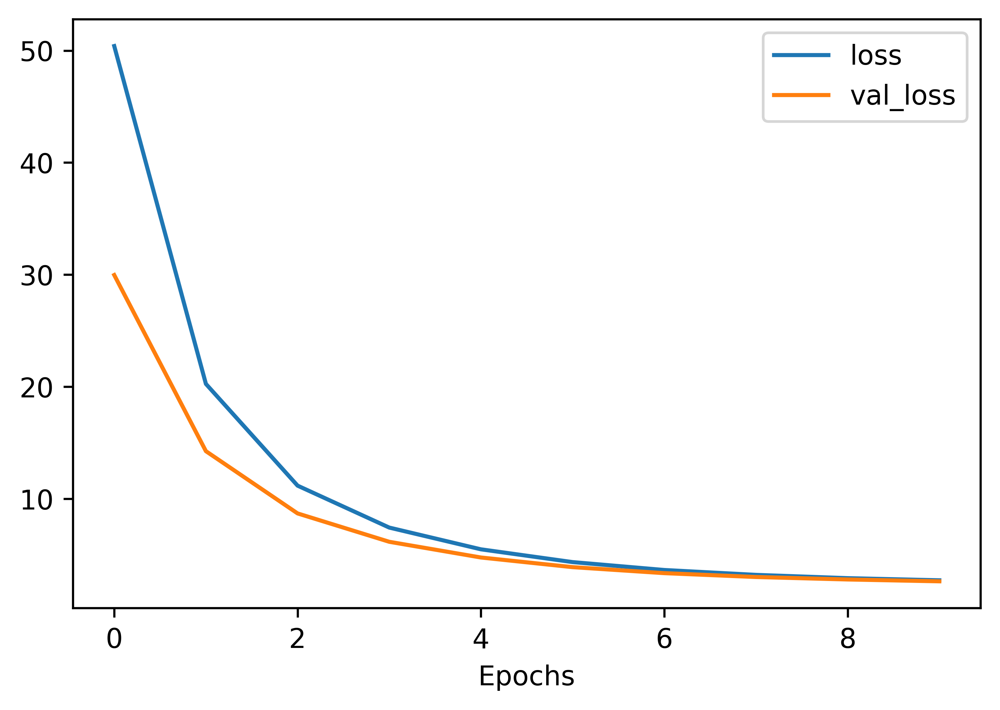

In [13]:
plt.plot(train_history.history['loss'])
plt.plot(train_history.history['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.xlabel('Epochs')
plt.show()

In [41]:
test_predictions = model.predict(test_gen_)

test_dataset.obsm["predicted_gene"] = test_predictions

In [56]:
test_predictions.reshape(1,-1).shape

(1, 3987)

/scratch/imb/Xiao/STimage/stimage/utils.py:113: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, cax=fig.add_axes(


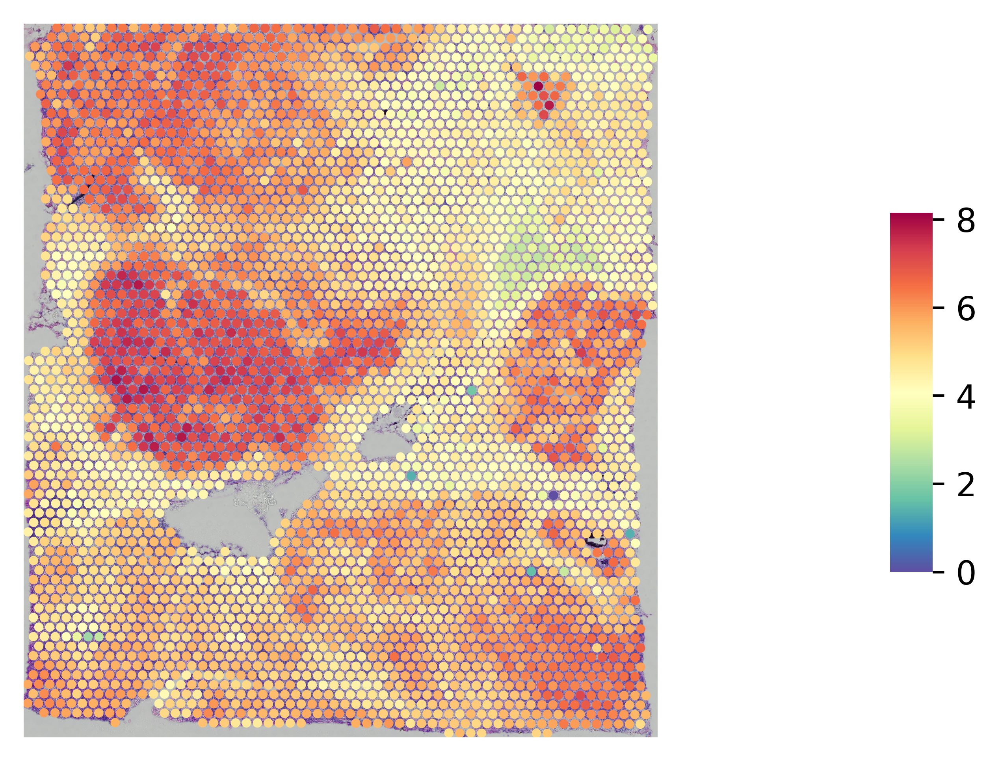

In [15]:
gene_plot(test_dataset, genes=gene, spot_size=8)

In [42]:
test_dataset_ = test_dataset[:,gene].copy()
test_dataset_.X = test_dataset_.obsm["predicted_gene"]

/scratch/imb/Xiao/STimage/stimage/utils.py:113: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, cax=fig.add_axes(


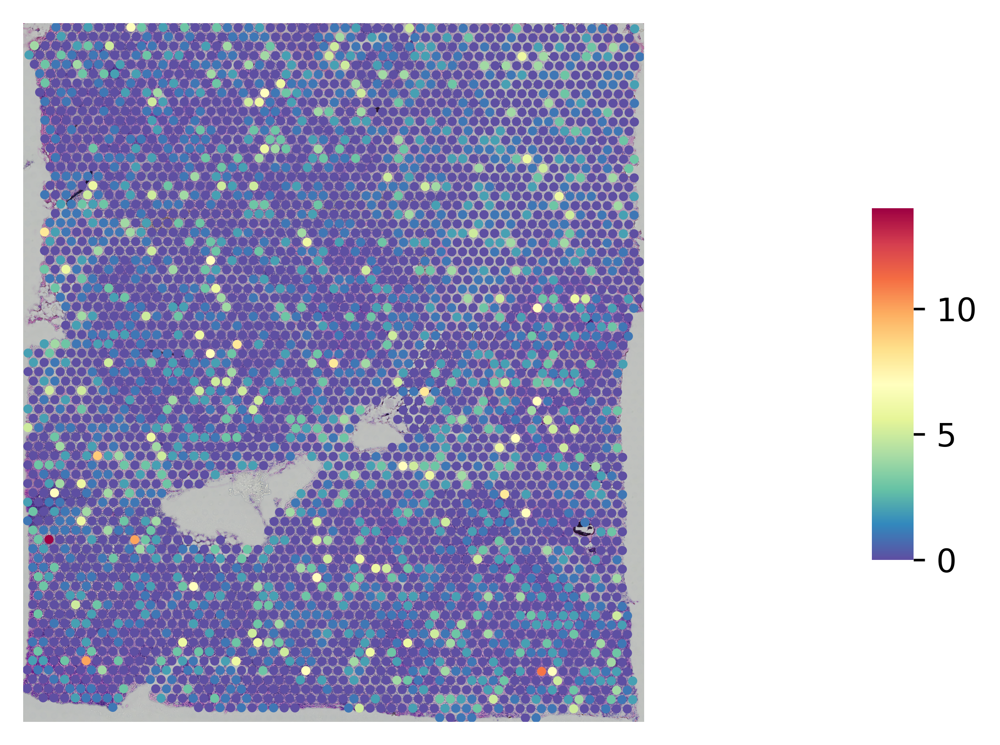

In [43]:
gene_plot(test_dataset_, genes=gene, spot_size=8)

In [18]:
from lime import lime_image

In [44]:
explainer = lime_image.LimeImageExplainer()

In [60]:
def predict_reshape(x):
    a = model.predict(x)
    return a.reshape(-1,1)

  0%|          | 0/1000 [00:00<?, ?it/s]

prediction: 0
ground truth: [5.4764633]


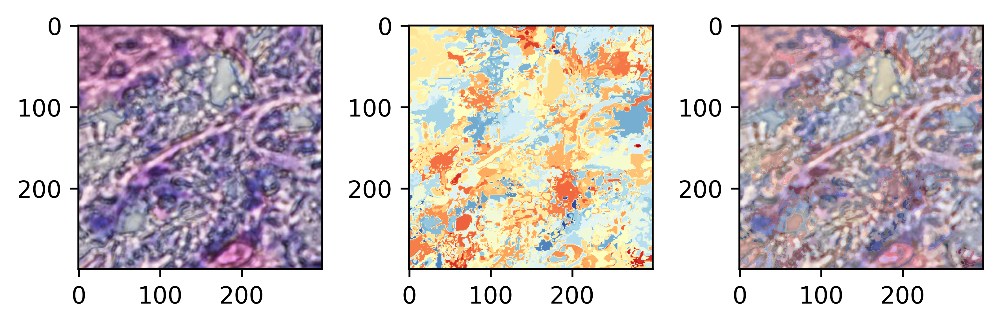

In [136]:
for image, label in test_gen.shuffle(100).take(1):
    explanation = explainer.explain_instance(image.numpy().astype("double"), 
                                             predict_reshape, top_labels=1, hide_color=0, num_samples=1000)
    dict_heatmap1 = dict(explanation.local_exp[explanation.top_labels[0]])
    heatmap1 = np.vectorize(dict_heatmap1.get)(explanation.segments)
#     heatmap1 = np.maximum(heatmap1, 0)
#     heatmap1 /= np.max(heatmap1)
    print("prediction: " + str(explanation.top_labels[0]))
    print("ground truth: " + str(label[0].numpy()))
    fig = plt.figure()
    plt.subplot(1, 3, 1)
    plt.imshow(image.numpy().astype(int))
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap1, alpha=1, cmap = 'RdYlBu_r')
    plt.subplot(1, 3, 3)
    plt.imshow(image.numpy().astype(int))
    plt.imshow(heatmap1, alpha=0.3, cmap = 'RdYlBu_r')
    plt.tight_layout()
    plt.show()
#     plt.colorbar()

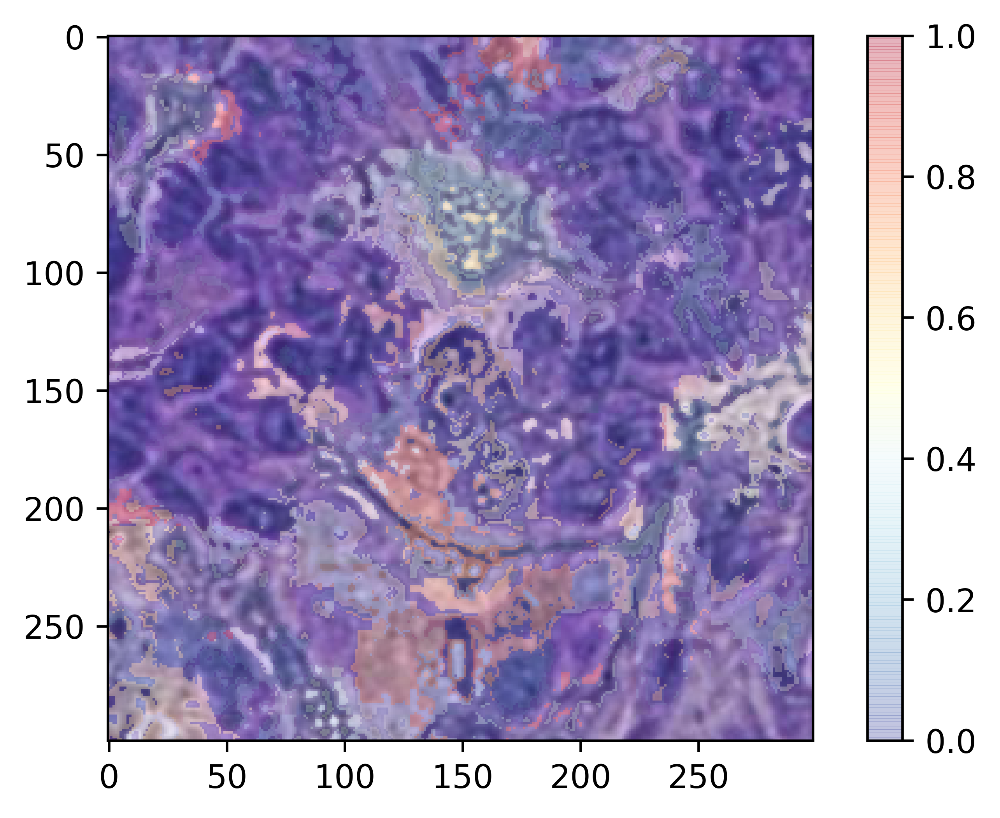

In [122]:
    dict_heatmap1 = dict(explanation.local_exp[explanation.top_labels[0]])
    heatmap1 = np.vectorize(dict_heatmap1.get)(explanation.segments)
    heatmap1 = np.maximum(heatmap1, 0)
    heatmap1 /= np.max(heatmap1)
    plt.imshow(image.numpy().astype(int))
    plt.imshow(heatmap1, alpha=0.3, cmap = 'RdYlBu_r')
    plt.colorbar()

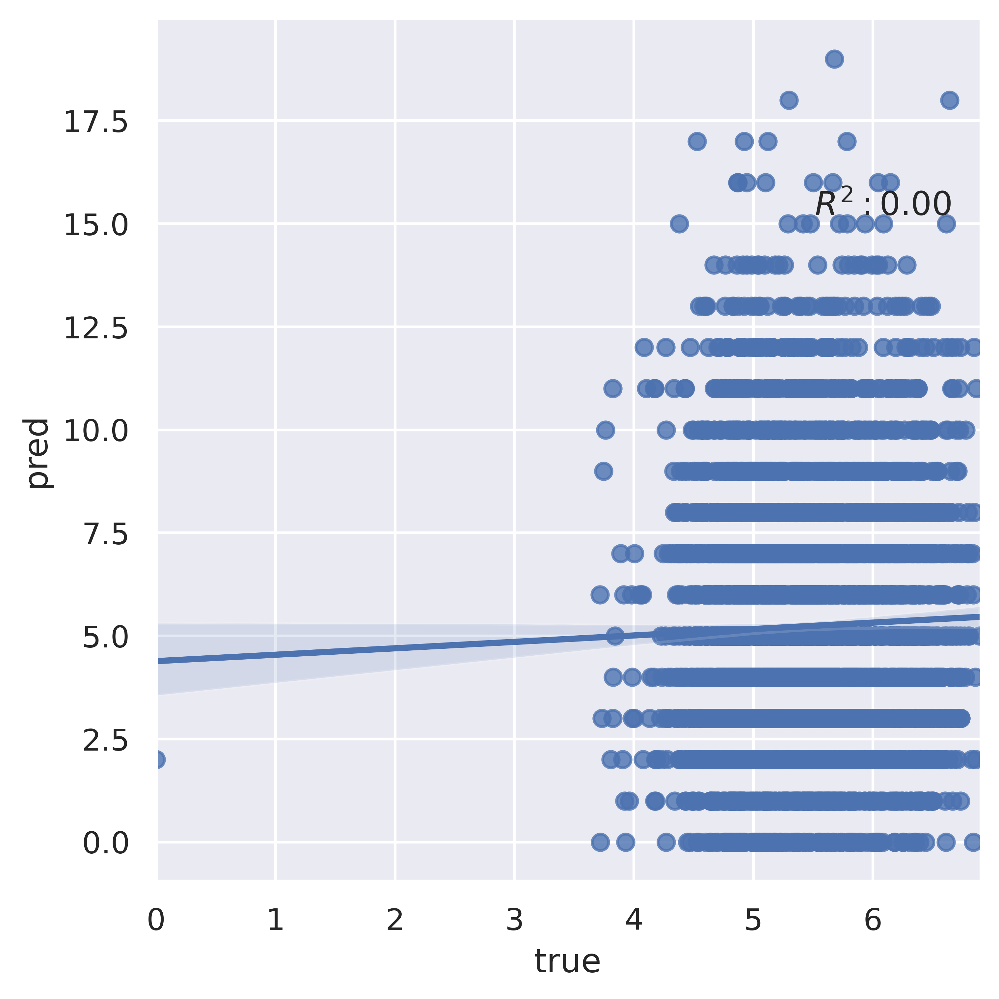

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

true_y = np.array(test_dataset[:,gene].to_df()).ravel()
pred_y = np.array(test_dataset_[:,gene].to_df()).ravel()
df = pd.DataFrame({"true_y":true_y, "pred_y":pred_y})
r2 = stats.pearsonr(true_y, 
                    pred_y)[0] ** 2
sns.set_theme()
g = sns.lmplot(data=df,
    x="true_y", y="pred_y",
    height=5, legend=True
)
# g.set(ylim=(0, 360), xlim=(0,360))

g.set_axis_labels("true", "pred")
plt.annotate(r'$R^2:{0:.2f}$'.format(r2),
            (max(true_y)*0.8, max(pred_y)*0.8))
plt.show()